# Variational Autoencoder


An LVM is defined by the joint density between observed and latent variables

$$
p(\textbf{x}, \textbf{z}) = \prod_{i=1}^N p(\textbf{x}_i|\textbf{z}_i) p(\textbf{z}_i)
$$

- If we use the **PCA recipe** (Linear mapping, Gaussian likelihood and Gaussian prior) we obtain an analytical Gaussian posterior and evidence
- If we use a more complex (non-linear) mapping, *e.g.* a neural network, the posterior and evidence may not be tractable

In the latter case, we can use **Variational inference (VI)**, *i.e.* we propose an approximate posterior and maximize the ELBO

$$
\begin{split}
\log p(x) \geq \mathcal{L}(\phi) &= \mathbb{E}_{z\sim q_\phi(z|x)} \left[\log \frac{p(x, z)}{q_\phi(z|x)}\right]  \\
&= \int q_\phi(z|x) \log \frac{p(x, z)}{q_\phi(z|x)} dz  
\end{split} 
$$

to find the best parameters $\hat \phi$. 

:::{important}

In this lesson we review the Variational AutoEncoder (VAE) which combines amortized inference and VI

:::

The VAE is an LVM where **deep neural networks** are used to model the **conditional distributions** between latent $z$ and observed $x$ variables

It was proposed simultaneously by [(Kingma and Welling, ICLR, Dec. 2013)](https://arxiv.org/pdf/1312.6114.pdf) and [(Rezende *et al*, ICML, Jan. 2014)](https://arxiv.org/abs/1401.4082) perhaps sparking the revived interest into **Deep Learning with Approximate Bayesian Inference** that we see today

The difference with a regular autoencoder is that the latent (code) is now a stochastic variable

- a prior distribution is placed on $z$: $p(z)$
- a neural network is used to model the parameters of the likelihood: $p_\theta(x | z)$
- a neural network is used to model the parameters of the approximate posterior: $q_\phi(z|x)$

:::{note}

The weight and biases of the networks ($\theta$ and $\phi$) are deterministic, *i.e.* VAE is not a "fully" bayesian neural network

:::


In what follows we will review the assumptions and the key contributions of this work to the field of Bayesian Neural Networks

## Assumptions in VAE

VAE assumes a particular prior and approximate posterior:

- The latent variable has a standard Gaussian prior (the same as in PCA)
- The approximate posterior is a factorized (diagonal) Gaussian

Mathematically this is 

$$
p(z_i) = \mathcal{N}(0, I)
$$

and

$$
q(z_i|x_i) = \mathcal{N}(\mu_i, I \sigma_i^2)
$$

The likelihood function is chosen depending on the data

- For continuous data the likelihood is typically set as a spherical Gaussian or diagonal Gaussian
- For binary data the likelihood is typically set as Bernoulli

Mathetamitcally (for the first case) this is 

$$
p(x_i|z_i) = \mathcal{N}(\hat \mu_i, I \hat \sigma_i^2)
$$

for $x_i \in \mathbb{R}^D$. 

## Details on the VAE training

The VAE is trained by maximizing the ELBO, which in this case is

$$
\begin{align}
\mathcal{L}(\theta, \phi) &= \mathbb{E}_{z\sim q_\phi(z|x)} \left [\log p_\theta(x|z) + \log p(z) - \log q_\phi(z|x) \right ] \nonumber \\
&= \mathbb{E}_{z\sim q_\phi(z|x)} \left [\log p_\theta(x|z) \right ] - D_{KL}\left[ q_\phi(z|x) || p(z) \right]\nonumber
\end{align}
$$

By maximizing the ELBO we

- Maximize the log likelihood when sampling from the approximate posterior: **Faithfull data reconstructions**
- Minimize the divergence between the approximate posterior and prior: **Regularization for the posterior**


The ELBO is typically optimized via gradient ascent updates for $\theta$ and $\phi$

$$
\theta_{t+1} = \theta_{t} + \eta \nabla_\theta \mathcal{L}(\theta_{t}, \phi_{t})
$$

$$
\phi_{t+1} = \phi_{t} + \eta \nabla_\phi \mathcal{L}(\theta_{t}, \phi_{t})
$$

Let's review how to obtain the derivates of the ELBO with respect to $\theta$ and $\phi$

### Amortization

In the previous formulation the amount of variational parameters, *i.e.* $\mu_i$ and $\sigma_i$ scales linearly with the number of samples in the dataset. This is impractical for large datasets. 

Amortization solves this problem by having a function that maps data to parameters. In the particular case of VAE we have

$$
\mu_i, \sigma_i = g_\phi(x_i)
$$

where $g_\phi(\cdot)$ is the **encoder network** and

$$
\hat \mu_i, \hat \sigma_i = f_\theta(z_i)
$$

where $f_\theta(\cdot)$ is the **decoder network** (for a diagonal Gaussian likelihood)

:::{note}

VAE is an example of amortized variational inference

:::

### The derivative with respect to $\theta$

The only term that depends on $\theta$ is $p_\theta(x|z)$, then

$$
\begin{split}
\nabla_\theta \mathcal{L}(\theta, \phi)  &= \nabla_\theta \mathbb{E}_{z\sim q_\phi(z|x)}\left [\log p_\theta(x|z)\right ] \\ 
&= \mathbb{E}_{z\sim q_\phi(z|x)} \left [\nabla_\theta \log  p_\theta(x|z)\right ] 
\end{split}
$$

where the gradient can be swapped with the expectation operator

The expectation can be estimated via monte-carlo integration as

$$
\begin{split}
\mathbb{E}_{z\sim q_\phi(z|x)} \left [\nabla_\theta \log  p_\theta(x|z)\right ] &= \int q_\phi(z|x) \nabla_\theta \log  p_\theta(x|z) \,dz  \\
&\approx \frac{1}{S} \sum_{k=1}^S  \nabla_\theta \log p_\theta(x|z^{(k)}), \quad z^{(k)} \sim  q_\phi(z|x) 
\end{split}
$$

### The derivative wrt to $\phi$

Let's write $h(z) = \log p_\theta(x|z)$, a function of $z$ that does not depend on $\phi$. In this case

$$
\begin{split}
\nabla_\phi  \mathcal{L}(\theta, \phi) &=  \nabla_\phi \mathbb{E}_{z\sim q_\phi(z|x)}\left [h(z) \right ] \\ 
&= \nabla_\phi \int q_\phi(z|x) h(z) dz \nonumber \\ &=  \int h(z) \nabla_\phi q_\phi(z|x)  dz 
\end{split}
$$

but we cannot approximate via Monte Carlo integration anymore. 

A classical solution to this is the [REINFORCE](http://www-anw.cs.umass.edu/~barto/courses/cs687/williams92simple.pdf) algorithm, which is based on the identity 

$$
\nabla_\phi\log q_\phi(z) = \frac{1}{ q_\phi(z)} \nabla_\phi q_\phi(z) 
$$

then

$$
\begin{split}
\nabla_\phi \mathbb{E}_{z\sim q_\phi(z|x)}\left [h(z)\right ]  &= \int h(z) \nabla_\phi q_\phi(z|x)  dz  \\
&= \int q_\phi(z) h(z) \nabla_\phi\log q_\phi(z)  dz  \\ 
&\approx \frac{1}{S} \sum_{k=1}^S h(z^{(k)}) \nabla_\phi \log q_\phi(z^{(k)}|x) \quad z^{(k)} \sim  q_\phi(z|x) 
\end{split}
$$

but in practice, training with this estimator is very hard: the REINFORCE estimator is unbiased but it has a very high variance

> For the particular case of VAE there is a low variance (and very elegant) alternative

### The reparameterization trick

In VAE the latent variable is distributed as

$$
z \sim \mathcal{N}(\mu_\phi(x), \sigma_\phi^2 (x) )
$$

this can be rewriten as first sampling from a standard Gaussian 

$$
\epsilon \sim \mathcal{N}(0, I)
$$

and then applying a transformation

$$
z = r(\phi, \epsilon) = \mu_\phi (x) + \epsilon \sigma_\phi (x)  
$$

:::{note}

This is usually referred to as "the reparameterization trick"

:::

Using this the expectation of $h(z)$ is rewritten as 

$$
\mathbb{E}_{z\sim q_\phi(z|x)}\left [h(z) \right ] =  \mathbb{E}_{\epsilon\sim \mathcal{N}(0, I)}\left [  h(r(\phi, \epsilon))  \right ] 
$$

:::{note}

The expectation does not depend on $\phi$

:::

Hence the following estimator for its gradient can be used

$$
\begin{split}
\nabla_\phi \mathbb{E}_{\epsilon\sim \mathcal{N}(0, I)}\left [  h(r(\phi, \epsilon))  \right ] 
&= \mathbb{E}_{\epsilon\sim \mathcal{N}(0, I)}\left [  h'(r(\phi, \epsilon)) \nabla_\phi r(\phi, \epsilon) \right ]  \\
&\approx \frac{1}{S} \sum_{k=1}^S h'(r(\phi, \epsilon^{(k)})) \nabla_\phi r(\phi, \epsilon^{(k)}) \quad \epsilon^{(k)} \sim  \mathcal{N}(0,I) 
\end{split}
$$

which has a [much lower variance than REINFORCE](https://nbviewer.jupyter.org/github/gokererdogan/Notebooks/blob/master/Reparameterization%20Trick.ipynb)

**More variance reduction:** Closed-form terms

We have focused on the left hand term of the ELBO

$$
\mathcal{L}(\theta, \phi) = \mathbb{E}_{z\sim q_\phi(z|x)} \left [\log p_\theta(x|z) \right ] - D_{KL}\left[ q_\phi(z|x) || p(z) \right]
$$

The right hand term is the KL divergence between two multivariate Gaussian distributions. This has a [closed analytical solution](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence#Multivariate_normal_distributions)

$$
D_\text{KL}\left[q_\phi(z|x) || p(z) \right] = \frac{1}{2}\sum_{j=1}^K \left(\mu_j^2 + \sigma_j^2 - \log \sigma_j^2 - 1 \right)
$$

where $K$ is the dimensionality of the latent variable

The derivatives of this expression are straighforward and the variance is low

## Writing a VAE in Numpyro

Neural networks written in `flax` can be "registered" into numpyro models using [`flax_module`](https://num.pyro.ai/en/stable/_modules/numpyro/contrib/module.html#flax_module). This lifts the neural network parameters as `numpyro.params`

Let's start by writing the generative model of VAE. The model starts from the latent variable, obtain the logits of the images using the decoder network and then match it with the observed data using a Bernoulli likelihood

In [1]:
import numpyro 
numpyro.set_platform("cpu") 
numpyro.set_host_device_count(2) 

In [2]:
from typing import Sequence, Callable
import jax.numpy as jnp
import flax.linen as nn
import numpyro.distributions as dists
from numpyro.contrib.module import flax_module

class Decoder(nn.Module):
    output_dim: int
    hidden_units: Sequence[int]
    activation: Callable = nn.relu
        
    @nn.compact
    def __call__(self, x):
        for neurons in self.hidden_units:
            x = self.activation(nn.Dense(neurons)(x))
        return nn.Dense(self.output_dim)(x)    
    
def model(batch, hidden_units, latent_dim, sample=False):
    batch_dim, out_dim = jnp.shape(batch)
    decoder = Decoder(hidden_units=hidden_units, output_dim=out_dim)
    decode = flax_module("decoder", decoder, input_shape=(batch_dim, latent_dim))
    with numpyro.plate("batch", size=batch_dim):
        z = numpyro.sample("z", dists.Normal(0, 1).expand([latent_dim]).to_event(1))
        logits = decode(z)
        if not sample:
            x = numpyro.sample("x", dists.BernoulliLogits(logits).to_event(1), obs=batch)
        else:
            x = numpyro.sample("x", dists.BernoulliLogits(logits).to_event(1))

:::{note}

Plates are used to make the model conditionally independent on the batch dimension (leftmost dimension)

:::

The encoder network amortizes the parameters of the approximate posterior (normal). The `Encoder` model has two outputs, the second being activated to be non-negative 

The guide receives a minibatch of data and return a sample from the approximate posterior

In [3]:
class Encoder(nn.Module):
    hidden_units: Sequence[int]
    latent_dim: int
    activation: Callable = nn.relu
    
    @nn.compact 
    def __call__(self, x):
        for neurons in self.hidden_units:            
            x = self.activation(nn.Dense(neurons)(x))
        loc = nn.Dense(self.latent_dim)(x)
        scale = nn.softplus(nn.Dense(self.latent_dim)(x))
        return loc, scale 
    
def guide(batch, hidden_units, latent_dim, sample=False):
    batch_dim, out_dim = jnp.shape(batch)
    encoder = Encoder(hidden_units=hidden_units, latent_dim=latent_dim)
    encode = flax_module("encoder", encoder, input_shape=(batch_dim, out_dim))
    with numpyro.plate("batch", size=batch_dim):
        z_loc, z_std = encode(batch)
        z = numpyro.sample("z", dists.Normal(z_loc, z_std).to_event(1))
        return z_loc, z_std

 The `optax` library provides a function called `chain` that allows for combining gradient transformations

The following shows how to implement a version of ADAM that clips large gradients for improved training stability

In [4]:
import optax

clipped_adam = optax.chain(optax.clip_by_global_norm(1.0),  
                           optax.scale_by_adam(),
                           optax.scale(-1e-3))

In preparation to train the VAE we create an `SVI` object using the model, guide, optimizer and cost function. In this case we are also passing a keyword argument (`latent_dim`)

The `svi.update` is "jittified" for improved computational efficiency

In [5]:
import jax
from numpyro.infer import SVI

hidden_units = [128, 128]
latent_dim = 2

svi = SVI(model, guide, clipped_adam, 
          numpyro.infer.TraceMeanField_ELBO(num_particles=1), 
          hidden_units=hidden_units, latent_dim=latent_dim)

jit_update = jax.jit(svi.update)

The following trains the VAE using minibatches from the MNIST dataset

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
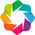

  0%|          | 0/100 [00:00<?, ?it/s]

:Curve   [Epoch]   (Loss)

In [6]:
import holoviews as hv
import jax.random as random
from tqdm.notebook import tqdm
from mnist import mnist
from flax_dataloader import data_loader
hv.extension('bokeh')

train_images, train_labels, test_images, test_labels = mnist();
batch_size = 128
nepochs = 100
key = random.PRNGKey(12345)
state = svi.init(key, train_images[:batch_size])
            
loss = []
for epoch in tqdm(range(nepochs)):
    key, key_ = jax.random.split(key)
    train_loader = data_loader(key_, train_images, train_labels, batch_size, shuffle=True)
    minibatch_loss = []
    for batch, labels in train_loader:
        state, loss_val = jit_update(state, batch)
        minibatch_loss.append(loss_val.item())
    
    loss.append(jnp.array(minibatch_loss).mean())
        
hv.Curve((range(nepochs), loss), 'Epoch', 'Loss').opts(width=500, height=200)

The parameter dictionary has the trained weight and biases of the encoder and decoder networks:

In [7]:
svi.get_params(state).keys()

dict_keys(['decoder$params', 'encoder$params'])

Let's inspect the latent and generative space using the trained models

:::{note}

In VAE, latent projections are not deterministic but distributions (normal)

:::

In [8]:
import numpy as np

encoder = Encoder(hidden_units, latent_dim)
encoder_params = svi.get_params(state)["encoder$params"]
z_loc, z_scale = encoder.apply({'params': encoder_params}, test_images)
z_loc = np.array(z_loc)
z_scale = np.array(z_scale)

The following shows a scatter plot of the test-set data projected to latent space

- The dots are centered on the mean of the projection
- The errorbars represent the standard deviation of the projection

In [9]:
from bokeh.palettes import Category10

hv.opts.defaults(hv.opts.ErrorBars(lower_head=None, upper_head=None, show_legend=True))

def plot_digit(digit, color):
    mask = test_labels.argmax(axis=1) == digit
    center = hv.Scatter((z_loc[mask, 0], z_loc[mask, 1])).opts(color=color)
    error_x = hv.ErrorBars((z_loc[mask, 0], z_loc[mask, 1], z_scale[mask, 0]), 
                           horizontal=True).opts(color=color)
    error_y = hv.ErrorBars((z_loc[mask, 0], z_loc[mask, 1], z_scale[mask, 1]), 
                           horizontal=False).opts(color=color)
    return hv.Overlay([center, error_x, error_y])

digits = [plot_digit(digit, color) for digit,color in zip(range(10), Category10[10])]
hv.Overlay(digits).opts(width=550, height=400, legend_position='right')

:Overlay
   .Scatter.I       :Scatter   [x]   (y)
   .ErrorBars.I     :ErrorBars   [x]   (y,yerror)
   .ErrorBars.II    :ErrorBars   [x]   (y,yerror)
   .Scatter.II      :Scatter   [x]   (y)
   .ErrorBars.III   :ErrorBars   [x]   (y,yerror)
   .ErrorBars.IV    :ErrorBars   [x]   (y,yerror)
   .Scatter.III     :Scatter   [x]   (y)
   .ErrorBars.V     :ErrorBars   [x]   (y,yerror)
   .ErrorBars.VI    :ErrorBars   [x]   (y,yerror)
   .Scatter.IV      :Scatter   [x]   (y)
   .ErrorBars.VII   :ErrorBars   [x]   (y,yerror)
   .ErrorBars.VIII  :ErrorBars   [x]   (y,yerror)
   .Scatter.V       :Scatter   [x]   (y)
   .ErrorBars.IX    :ErrorBars   [x]   (y,yerror)
   .ErrorBars.X     :ErrorBars   [x]   (y,yerror)
   .Scatter.VI      :Scatter   [x]   (y)
   .ErrorBars.XI    :ErrorBars   [x]   (y,yerror)
   .ErrorBars.XII   :ErrorBars   [x]   (y,yerror)
   .Scatter.VII     :Scatter   [x]   (y)
   .ErrorBars.XIII  :ErrorBars   [x]   (y,yerror)
   .ErrorBars.XIV   :ErrorBars   [x]   (y,yerror)
   .Scatter.VIII    :Scatter   [x]   (y)
   .ErrorBars.XV    :ErrorBars   [x]   (y,yerror)
   .ErrorBars.XVI   :ErrorBars   [x]   (y,yerror)
   .Scatter.IX      :Scatter   [x]   (y)
   .ErrorBars.XVII  :ErrorBars   [x]   (y,yerror)
   .ErrorBars.XVIII :ErrorBars   [x]   (y,yerror)
   .Scatter.X       :Scatter   [x]   (y)
   .ErrorBars.XIX   :ErrorBars   [x]   (y,yerror)
   .ErrorBars.XX    :ErrorBars   [x]   (y,yerror)

The VAE is a generative model, this means that one sample does not have one reconstruction but a distribution of reconstructions (Bernoulli)

The following uses `Predictive` to sample from the model through the guide. The plot shows five test-set examples each with three samples from the generative distribution

In [10]:
predictive = numpyro.infer.Predictive(model, 
                                      guide=svi.guide, 
                                      params=svi.get_params(state), 
                                      return_sites=['x'],
                                      num_samples=3)

xhat = predictive(random.PRNGKey(1), 
                  test_images[:5], 
                  hidden_units=hidden_units, 
                  latent_dim=latent_dim, 
                  sample=True)['x']

hv.opts.defaults(hv.opts.Image(cmap='gray', xaxis=None, yaxis=None))
examples = [hv.Image(example.reshape(28, 28)) for example in test_images[:5]]
reconstructed = []
for k in range(3):
    reconstructed += [hv.Image(example.reshape(28, 28)) for example in np.array(xhat[k])]

hv.Layout(examples + reconstructed).opts(hv.opts.Image(width=100, height=100)).cols(5)

:Layout
   .Image.I     :Image   [x,y]   (z)
   .Image.II    :Image   [x,y]   (z)
   .Image.III   :Image   [x,y]   (z)
   .Image.IV    :Image   [x,y]   (z)
   .Image.V     :Image   [x,y]   (z)
   .Image.VI    :Image   [x,y]   (z)
   .Image.VII   :Image   [x,y]   (z)
   .Image.VIII  :Image   [x,y]   (z)
   .Image.IX    :Image   [x,y]   (z)
   .Image.X     :Image   [x,y]   (z)
   .Image.XI    :Image   [x,y]   (z)
   .Image.XII   :Image   [x,y]   (z)
   .Image.XIII  :Image   [x,y]   (z)
   .Image.XIV   :Image   [x,y]   (z)
   .Image.XV    :Image   [x,y]   (z)
   .Image.XVI   :Image   [x,y]   (z)
   .Image.XVII  :Image   [x,y]   (z)
   .Image.XVIII :Image   [x,y]   (z)
   .Image.XIX   :Image   [x,y]   (z)
   .Image.XX    :Image   [x,y]   (z)

The following computes the mean of the Bernoulli distribution as a function of the latent variable

In [11]:
decoder = Decoder(hidden_units=hidden_units, output_dim=28*28)
decoder_params = svi.get_params(state)["decoder$params"]

res = 30
z = jnp.linspace(-3, 3, num=res)
z1, z2 = jnp.meshgrid(z, z)
zz = jnp.stack((z1.ravel(), z2.ravel()))
p = nn.sigmoid(decoder.apply({'params': decoder_params}, zz.T)).reshape(res, res, 28, 28)
hv.Image(np.array(p.swapaxes(2,1).reshape(28*res, 28*res))).opts(width=600, height=600) 

:Image   [x,y]   (z)